<a href="https://colab.research.google.com/github/tdineth/Image-Processing-CO5430-4th-sem/blob/main/lab02/E_23_076_Lab_02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [3]:
file_path = "/content/drive/MyDrive/Image Processing - CO5430 - 4th sem/lab2"

### Task 1 — Visualize Intensity & Histograms

-- Note :
### Pixel intensity

Pixel intensity is the **brightness value of one pixel**.

For an 8-bit grayscale image:

```text
0      → completely black
128    → medium gray
255    → completely white
```

Example:

```python
print(img1[100,100])
```

Output:

```text
145
```

This means that one pixel has brightness intensity **145**.

---

### Frequency

Frequency tells **how many pixels in the image have a certain intensity**.

The histogram counts them.

Example:

```text
Intensity     Number of pixels
0             500
50            1200
120           3000
255           700
```

Here:

* **120** = pixel intensity value
* **3000** = frequency

Meaning:

> 3000 pixels in the image have brightness 120.

---

In your histogram:

* **x-axis** → pixel intensity values (0–255)
* **y-axis** → frequency (number of pixels)

So when you see a large peak:

```text
        ^
freq    |        /\
        |       /  \
        |______/____\_____
              intensity
```

it means:

> many pixels share those brightness values.

For your dark image:

* most pixels have low intensity values
* therefore histogram peak appears on the left

For bright image:

* most pixels have high intensity values
* peak shifts right

Thresholding uses **pixel intensity**, not frequency:

```text
if intensity >120 → white
else → black
```

The histogram frequency is only helping you understand where most pixels are located.




```
hist3=cv2.calcHist([img3],[0],None,[256],[0,256])
```



[img3] — the source image (wrapped in a list because OpenCV supports multi‑image histograms).

[0] — the channel index.

  - 0 = grayscale or the Blue channel if the image is BGR.

None — no mask (use the whole image).

[256] — number of bins (one for each intensity level).

[0,256] — the intensity range to consider.

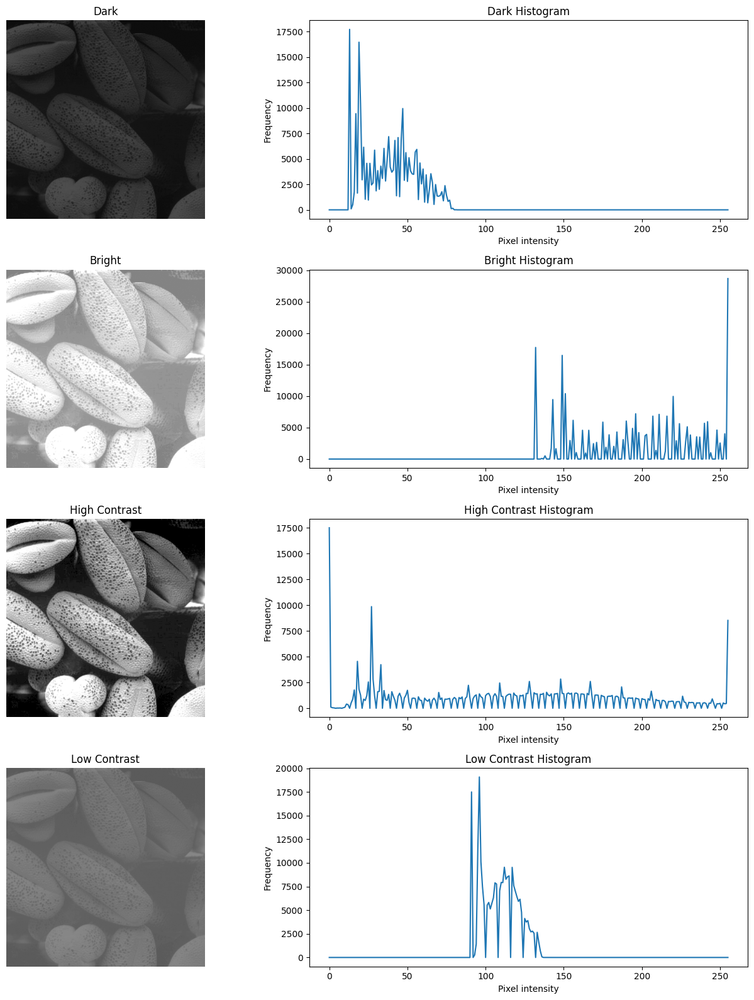

In [4]:
img1=cv2.imread(f"{file_path}/dark.tif",0)
img2=cv2.imread(f"{file_path}/bright.tif",0)
img3=cv2.imread(f"{file_path}/high_contrast.tif",0)
img4=cv2.imread(f"{file_path}/low_contrast.tif",0)

hist1=cv2.calcHist([img1],[0],None,[256],[0,256])
hist2=cv2.calcHist([img2],[0],None,[256],[0,256])
hist3=cv2.calcHist([img3],[0],None,[256],[0,256])
hist4=cv2.calcHist([img4],[0],None,[256],[0,256])

plt.figure(figsize=(14,16))

images=[img1,img2,img3,img4]
hists=[hist1,hist2,hist3,hist4]

titles=["Dark","Bright","High Contrast","Low Contrast"]

for i in range(4):

    plt.subplot(4,2,2*i+1)

    plt.imshow(
        images[i],
        cmap='gray',
        vmin=0,
        vmax=255
    )

    plt.title(titles[i])
    plt.axis("off")

    plt.subplot(4,2,2*i+2)

    plt.plot(hists[i])

    plt.title(
        titles[i]+" Histogram"
    )

    plt.xlabel("Pixel intensity")
    plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

**Describe how the histogram shape relates to the lighting condition and why understanding distribution is
essential for image processing**

The histogram shape directly reflects the lighting condition of an image because it shows how pixel intensities are distributed. The dark image histogram is concentrated toward lower intensity values around the left side, indicating that most pixels are dim. The bright image histogram shifts toward the right side with high intensity values, showing overexposed or highly illuminated regions. The high contrast image has a wide histogram spread across a larger intensity range which indicates strong separation between dark and bright areas. The low contrast image contains a narrow histogram concentrated within a small intensity range, causing the image to appear dull and lacking detail. Understanding intensity distribution is essential in image processing because histogram analysis helps identify illumination conditions and choose suitable enhancement methods such as contrast stretching, thresholding or histogram equalization. Without understanding pixel distribution, image enhancement and segmentation methods may produce poor results.

**If two images have similar histograms, can they still look visually different? Why?**

Yes. Histograms only show the distribution of intensity values and ignore spatial arrangement. Two images may contain identical pixel intensity distributions but place those pixels in completely different positions. Therefore visual appearance, shapes and object structures can differ significantly despite similar histograms.

### Task 2 — Manual Threshold & Observe Failure Cases



```
_, th = cv2.threshold(img, 120, 255, cv2.THRESH_BINARY)
```



It applies a binary threshold at value 120, producing a black‑and‑white image th. The first returned value (stored as _) is the threshold used, which you normally don’t need.


With cv2.THRESH_BINARY:

- Pixels > 120 → set to 255 (white)

- Pixels ≤ 120 → set to 0 (black)

This is useful for segmentation, masks, OCR preprocessing, etc.

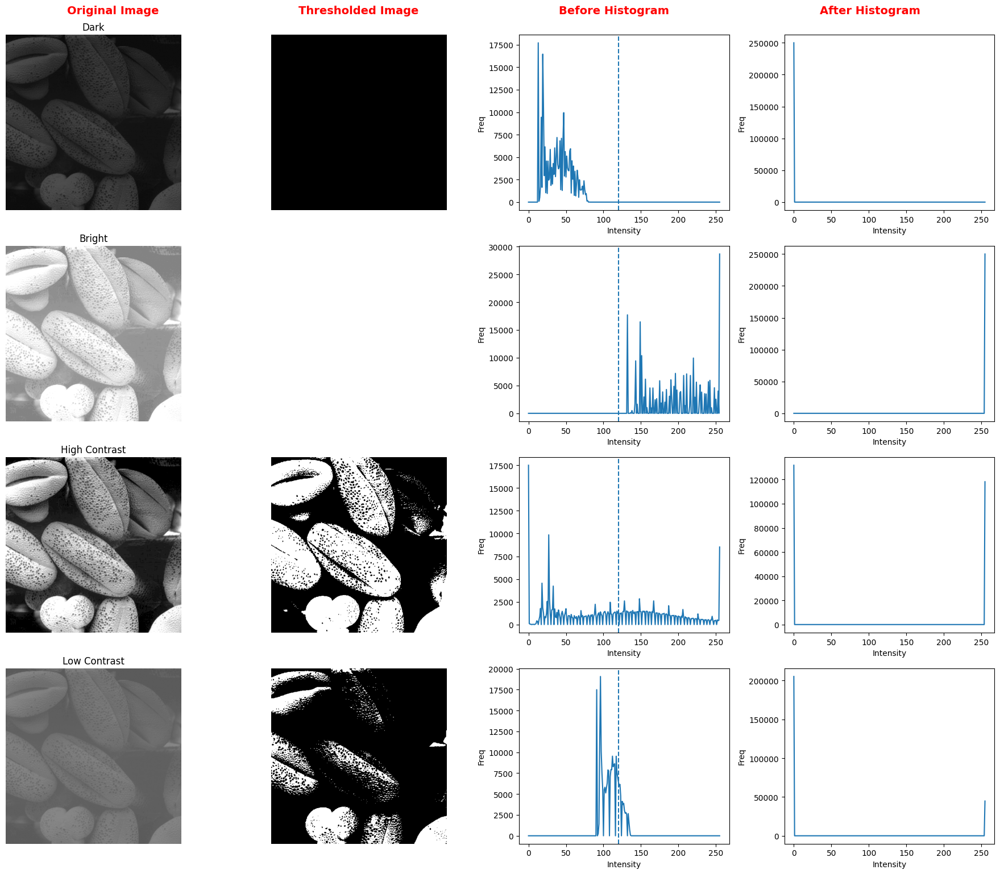

In [5]:
threshold=120

images=[img1,img2,img3,img4]
titles=["Dark","Bright","High Contrast","Low Contrast"]

plt.figure(figsize=(18,16))

# Column headings
plt.figtext(0.13, 0.95, "Original Image", ha='center', fontsize=14, color='red', fontweight='bold')
plt.figtext(0.37, 0.95, "Thresholded Image", ha='center', fontsize=14, color='red', fontweight='bold')
plt.figtext(0.62, 0.95, "Before Histogram", ha='center', fontsize=14, color='red', fontweight='bold')
plt.figtext(0.87, 0.95, "After Histogram", ha='center', fontsize=14, color='red', fontweight='bold')

for i in range(4):

    _,th=cv2.threshold(
        images[i],
        threshold,
        255,
        cv2.THRESH_BINARY
    )

    hist_before=cv2.calcHist(
        [images[i]],
        [0],
        None,
        [256],
        [0,256]
    )

    hist_after=cv2.calcHist(
        [th],
        [0],
        None,
        [256],
        [0,256]
    )

    plt.subplot(4,4,4*i+1)

    plt.imshow(
        images[i],
        cmap='gray',
        vmin=0,
        vmax=255
    )

    plt.title(titles[i])
    plt.axis("off")


    plt.subplot(4,4,4*i+2)

    plt.imshow(
        th,
        cmap='gray',
        vmin=0,
        vmax=255
    )

    plt.axis("off")


    plt.subplot(4,4,4*i+3)

    plt.plot(hist_before)

    plt.axvline(
        x=threshold,
        linestyle='--'
    )

    plt.xlabel("Intensity")
    plt.ylabel("Freq")


    plt.subplot(4,4,4*i+4)

    plt.plot(hist_after)

    plt.xlabel("Intensity")
    plt.ylabel("Freq")


plt.tight_layout(rect=[0,0,1,.95])

plt.show()

**Discuss why the same threshold cannot handle all
illumination conditions and identify regions where misclassification occurs**

Manual thresholding using a fixed threshold value of 120 produced different segmentation results under different illumination conditions. The dark image failed because nearly all intensity values were below the threshold as shown in the histogram concentrated on the left side. As a result almost all pixels were converted to black producing a fully dark thresholded image. The bright image had most intensity values greater than the threshold and therefore most pixels became white. In the high contrast image pixel values were distributed across both sides of the threshold value, resulting in better separation between foreground and background. The low contrast image contained a narrow intensity distribution close to the threshold value which caused overlapping intensity ranges and incorrect classification of object regions. Misclassification mainly occurred in shadowed areas and regions with gradual intensity changes. These observations demonstrate that a fixed threshold cannot adapt effectively to different lighting conditions.

Observations:
- Dark image: histogram lies mostly left of 120 → almost all pixels become black.
- Bright image: histogram lies mostly right of 120 → pixels become white.
- High contrast: histogram spreads on both sides → better foreground/background separation.
- Low contrast: intensities cluster near threshold → unstable decisions and loss of detail.

**Is thresholding really “deciding” what an object is, or just comparing brightness?**

Thresholding does not identify or understand objects. It simply compares pixel intensity values with a selected threshold and classifies pixels according to brightness. It has no understanding of object shape, meaning or context. Therefore thresholding may fail under changing illumination conditions even when humans can easily recognize the objects.

### Task 3 — Apply Otsu & Adaptive Thresholding

| Method                    |                                  How threshold is selected | Works best when                                                | Main advantage                     | Main limitation                   |
| ------------------------- | ---------------------------------------------------------: | -------------------------------------------------------------- | ---------------------------------- | --------------------------------- |
| **Manual Thresholding**   |                                 User chooses a fixed value | Lighting is uniform                                            | Very simple and fast               | Sensitive to illumination changes |
| **Otsu Thresholding**     | Algorithm automatically finds one optimal global threshold | Image histogram has two distinct peaks (foreground/background) | No need to manually pick threshold | Struggles with uneven lighting    |
| **Adaptive Thresholding** |          Threshold calculated separately for local regions | Uneven illumination or shadows                                 | Handles varying brightness well    | More computationally expensive    |


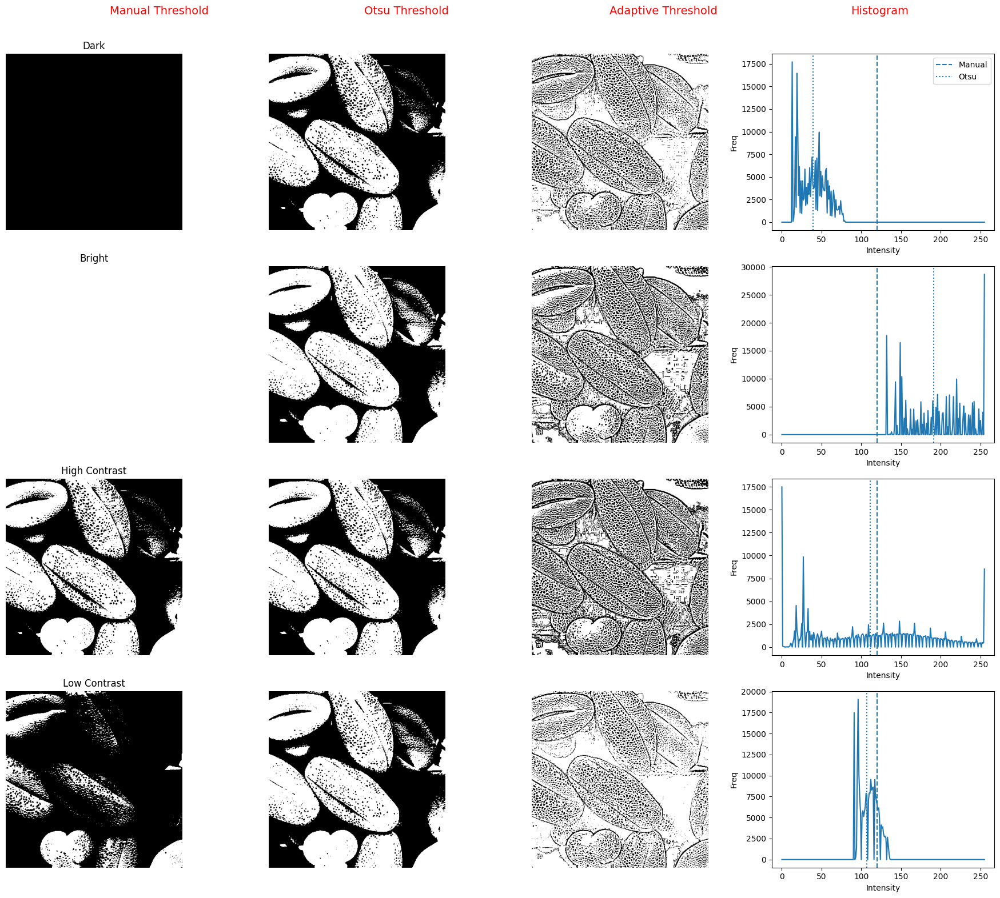

In [6]:
images=[img1,img2,img3,img4]
titles=["Dark","Bright","High Contrast","Low Contrast"]

plt.figure(figsize=(18,16))

plt.figtext(0.18,0.97,"Manual Threshold",ha='center',
fontsize=14,color='red')

plt.figtext(0.42,0.97,"Otsu Threshold",ha='center',
fontsize=14,color='red')

plt.figtext(0.67,0.97,"Adaptive Threshold",ha='center',
fontsize=14,color='red')

plt.figtext(0.88,0.97,"Histogram",ha='center',
fontsize=14,color='red')


for i in range(4):

    _,manual=cv2.threshold(
        images[i],
        120,
        255,
        cv2.THRESH_BINARY
    )

    otsu_value,otsu=cv2.threshold(
        images[i],
        0,
        255,
        cv2.THRESH_BINARY+cv2.THRESH_OTSU
    )

    adaptive=cv2.adaptiveThreshold(
        images[i],
        255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY,
        11,
        2
    )

    hist=cv2.calcHist(
        [images[i]],
        [0],
        None,
        [256],
        [0,256]
    )

    plt.subplot(4,4,4*i+1)
    plt.imshow(manual,cmap='gray',
               vmin=0,vmax=255)
    plt.title(titles[i])
    plt.axis("off")


    plt.subplot(4,4,4*i+2)
    plt.imshow(otsu,cmap='gray',
               vmin=0,vmax=255)
    plt.axis("off")


    plt.subplot(4,4,4*i+3)
    plt.imshow(adaptive,
               cmap='gray',
               vmin=0,
               vmax=255)
    plt.axis("off")


    plt.subplot(4,4,4*i+4)

    plt.plot(hist)

    plt.axvline(
        x=120,
        linestyle='--',
        label="Manual"
    )

    plt.axvline(
        x=otsu_value,
        linestyle=':',
        label="Otsu"
    )

    plt.xlabel("Intensity")
    plt.ylabel("Freq")

    if i==0:
        plt.legend()

plt.tight_layout(rect=[0,0,1,.95])

plt.show()

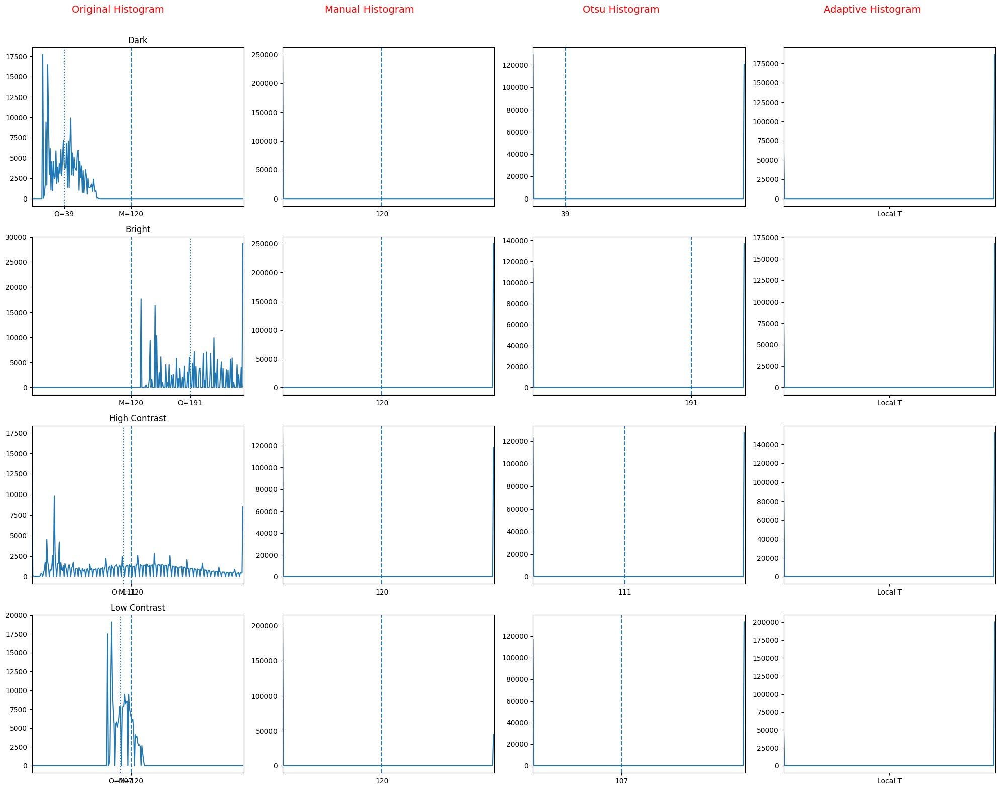

In [7]:
images=[img1,img2,img3,img4]
titles=["Dark","Bright","High Contrast","Low Contrast"]

plt.figure(figsize=(20,16))

plt.figtext(0.12,0.97,"Original Histogram",
ha='center',fontsize=14,color='red')

plt.figtext(0.37,0.97,"Manual Histogram",
ha='center',fontsize=14,color='red')

plt.figtext(0.62,0.97,"Otsu Histogram",
ha='center',fontsize=14,color='red')

plt.figtext(0.87,0.97,"Adaptive Histogram",
ha='center',fontsize=14,color='red')


for i in range(4):

    manual_T=120

    _,manual=cv2.threshold(
        images[i],
        manual_T,
        255,
        cv2.THRESH_BINARY
    )

    otsu_value,otsu=cv2.threshold(
        images[i],
        0,
        255,
        cv2.THRESH_BINARY+cv2.THRESH_OTSU
    )

    adaptive=cv2.adaptiveThreshold(
        images[i],
        255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY,
        11,
        2
    )

    original_hist=cv2.calcHist(
        [images[i]],[0],
        None,[256],[0,256]
    )

    manual_hist=cv2.calcHist(
        [manual],[0],
        None,[256],[0,256]
    )

    otsu_hist=cv2.calcHist(
        [otsu],[0],
        None,[256],[0,256]
    )

    adaptive_hist=cv2.calcHist(
        [adaptive],[0],
        None,[256],[0,256]
    )


    # Original
    plt.subplot(4,4,4*i+1)
    plt.plot(original_hist)

    plt.axvline(
        x=manual_T,
        linestyle='--'
    )

    plt.axvline(
        x=otsu_value,
        linestyle=':'
    )

    plt.xticks(
        [manual_T,int(otsu_value)],
        [f"M={manual_T}",
         f"O={int(otsu_value)}"]
    )

    plt.title(titles[i])
    plt.xlim([0,256])


    # Manual
    plt.subplot(4,4,4*i+2)
    plt.plot(manual_hist)

    plt.axvline(
        x=manual_T,
        linestyle='--'
    )

    plt.xticks(
        [manual_T],
        [str(manual_T)]
    )

    plt.xlim([0,256])


    # Otsu
    plt.subplot(4,4,4*i+3)
    plt.plot(otsu_hist)

    plt.axvline(
        x=otsu_value,
        linestyle='--'
    )

    plt.xticks(
        [int(otsu_value)],
        [str(int(otsu_value))]
    )

    plt.xlim([0,256])


    # Adaptive
    plt.subplot(4,4,4*i+4)
    plt.plot(adaptive_hist)

    plt.xticks(
        [128],
        ["Local T"]
    )

    plt.xlim([0,256])


plt.tight_layout(rect=[0,0,1,.95])

plt.show()

**Compare results to
manual thresholding and explain why data-driven decisions often outperform fixed pixel cutoffs.**

Otsu and adaptive thresholding performed better than manual thresholding because they adjust according to image characteristics instead of using one fixed threshold value. Manual thresholding used a threshold of 120 for every image and failed under varying illumination conditions. In the dark image manual thresholding completely failed and produced an almost black result because most pixel values were below the threshold. Otsu selected a lower threshold value from the histogram and successfully separated foreground and background. In the bright image Otsu again selected a threshold appropriate to the pixel distribution rather than using a fixed cutoff. For the high contrast image both manual and Otsu methods performed reasonably well because the intensity distributions were already well separated. In the low contrast image Otsu improved segmentation by selecting a threshold closer to the clustered pixel intensities. Adaptive thresholding calculated local thresholds for small image regions and preserved details under varying illumination conditions. These results demonstrate that data-driven thresholding generally performs better than fixed threshold selection because it adapts according to image statistics.

Observations
- Dark image: Manual threshold = 120 was too high. Otsu selected a much lower threshold and recovered object regions.
- Bright image: Otsu shifted threshold according to intensity distribution.
- High contrast image: Otsu and manual thresholds were very similar because the histogram already had good separation.
- Low contrast image: Otsu selected a threshold close to the narrow histogram peak and improved segmentation.

**Note**

Textured images are images that contain **repeating patterns, surface details, or variations in intensity** that create a sense of structure or appearance across a region.

Instead of having large smooth areas with similar pixel values, textured images have pixels that change in a patterned way.

Examples:

Typical textured images:

* Brick walls
* Grass
* Sand
* Fabric
* Wood grain
* Fingerprints
* Leaves
* Skin patterns

Characteristics of texture:

* **Repetition** → repeated elements or patterns
* **Variation in intensity** → neighboring pixels differ
* **Spatial arrangement** → not random noise, but organized structure
* **Surface appearance** → rough, smooth, striped, dotted, woven, etc.

Examples in image processing:

**Low texture image**

* Clear sky
* Plain wall
* White paper

These have almost uniform pixel values.

**High texture image**

* Tree bark
* Carpet
* Fur
* Crowd scenes

These contain lots of intensity changes.

Texture is important in computer vision because it helps with:

* Image segmentation
* Object recognition
* Medical imaging
* Surface defect detection
* Remote sensing

Mathematically texture is often described using statistics from neighboring pixels, such as:

* Local variance
* Co-occurrence matrices (GLCM)
* Entropy
* Frequency analysis using Fourier or wavelets

For thresholding specifically, textured images can be difficult because local intensity changes may confuse a single global threshold. Adaptive methods often perform better than manual thresholds on highly textured regions.


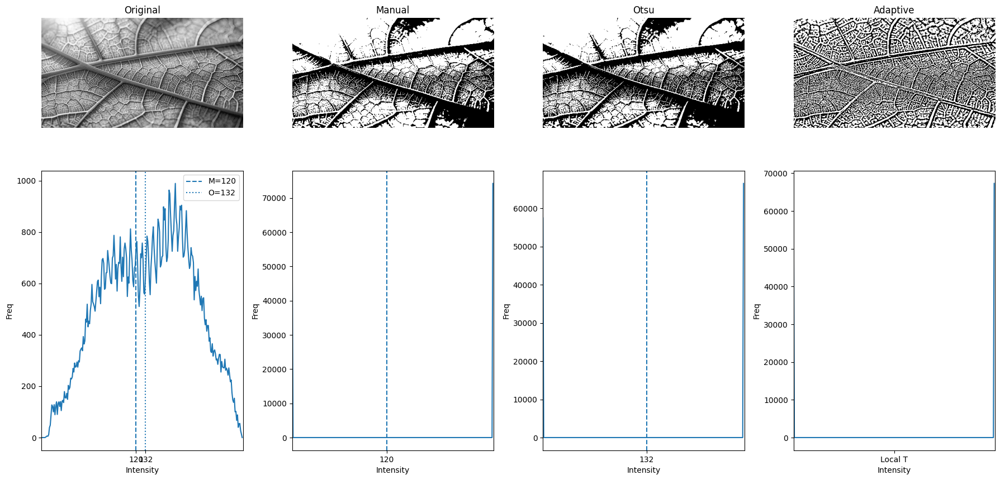

In [8]:
texture_img=cv2.imread(
    f"{file_path}/textured.webp",
    cv2.IMREAD_GRAYSCALE
)

manual_T=120

_,manual=cv2.threshold(
    texture_img,
    manual_T,
    255,
    cv2.THRESH_BINARY
)

otsu_value,otsu=cv2.threshold(
    texture_img,
    0,
    255,
    cv2.THRESH_BINARY+cv2.THRESH_OTSU
)

adaptive=cv2.adaptiveThreshold(
    texture_img,
    255,
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY,
    11,
    2
)


original_hist=cv2.calcHist(
    [texture_img],
    [0],
    None,
    [256],
    [0,256]
)

manual_hist=cv2.calcHist(
    [manual],
    [0],
    None,
    [256],
    [0,256]
)

otsu_hist=cv2.calcHist(
    [otsu],
    [0],
    None,
    [256],
    [0,256]
)

adaptive_hist=cv2.calcHist(
    [adaptive],
    [0],
    None,
    [256],
    [0,256]
)


plt.figure(figsize=(18,10))

titles=[
    "Original",
    "Manual",
    "Otsu",
    "Adaptive"
]

images=[
    texture_img,
    manual,
    otsu,
    adaptive
]

hists=[
    original_hist,
    manual_hist,
    otsu_hist,
    adaptive_hist
]


# Top row images
for i in range(4):

    plt.subplot(2,4,i+1)

    plt.imshow(
        images[i],
        cmap='gray',
        vmin=0,
        vmax=255
    )

    plt.title(titles[i])

    plt.axis("off")


# Bottom row histograms
for i in range(4):

    plt.subplot(2,4,i+5)

    plt.plot(hists[i])

    if i==0:

        plt.axvline(
            x=manual_T,
            linestyle='--',
            label=f'M={manual_T}'
        )

        plt.axvline(
            x=otsu_value,
            linestyle=':',
            label=f'O={int(otsu_value)}'
        )

        plt.xticks(
            [manual_T,int(otsu_value)],
            [manual_T,int(otsu_value)]
        )

        plt.legend()


    elif i==1:

        plt.axvline(
            x=manual_T,
            linestyle='--'
        )

        plt.xticks(
            [manual_T],
            [manual_T]
        )


    elif i==2:

        plt.axvline(
            x=otsu_value,
            linestyle='--'
        )

        plt.xticks(
            [int(otsu_value)],
            [int(otsu_value)]
        )


    else:

        plt.xticks(
            [128],
            ["Local T"]
        )


    plt.xlim([0,256])

    plt.xlabel("Intensity")

    plt.ylabel("Freq")


plt.tight_layout()

plt.show()

**Why can adaptive thresholding still struggle on textured backgrounds?**

Adaptive thresholding computes thresholds using local neighborhoods rather than a single global value. On textured backgrounds there are many small intensity changes and patterns. These variations may be interpreted as meaningful object boundaries even when they belong to background texture. As a result adaptive thresholding can create noisy segmentation and false object regions.

One interesting thing visible in result: adaptive thresholding preserved many tiny details and textures, but it also introduced a lot of small speckle patterns. That directly supports the "textured background" discussion.

### Task 4 — Gamma & Log Transformations

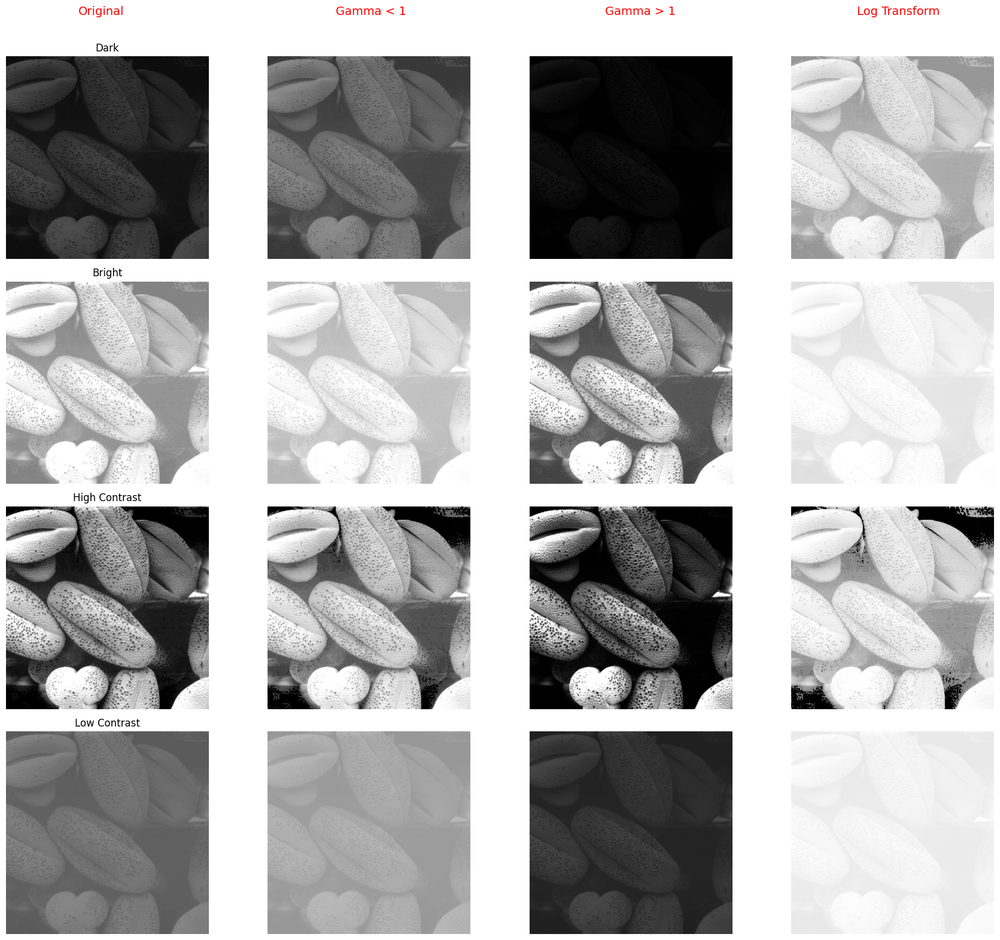

In [9]:
images=[img1,img2,img3,img4]
titles=["Dark","Bright","High Contrast","Low Contrast"]

plt.figure(figsize=(18,16))

plt.figtext(0.13,0.97,"Original",
ha='center',fontsize=14,color='red')

plt.figtext(0.38,0.97,"Gamma < 1",
ha='center',fontsize=14,color='red')

plt.figtext(0.63,0.97,"Gamma > 1",
ha='center',fontsize=14,color='red')

plt.figtext(0.87,0.97,"Log Transform",
ha='center',fontsize=14,color='red')


for i in range(4):

    img=images[i]

    # Gamma less than 1
    gamma1=0.5

    gamma_low=np.power(
        img/255.0,
        gamma1
    )

    gamma_low=np.uint8(
        gamma_low*255
    )


    # Gamma greater than 1
    gamma2=2.0

    gamma_high=np.power(
        img/255.0,
        gamma2
    )

    gamma_high=np.uint8(
        gamma_high*255
    )


    # Log transform

    img_float=img.astype(np.float32)

    log_img=np.log1p(img_float)

    log_img=log_img/np.max(log_img)

    log_img=np.uint8(log_img*255)


    plt.subplot(4,4,4*i+1)

    plt.imshow(
        img,
        cmap='gray',
        vmin=0,
        vmax=255
    )

    plt.title(titles[i])

    plt.axis("off")


    plt.subplot(4,4,4*i+2)

    plt.imshow(
        gamma_low,
        cmap='gray',
        vmin=0,
        vmax=255
    )

    plt.axis("off")


    plt.subplot(4,4,4*i+3)

    plt.imshow(
        gamma_high,
        cmap='gray',
        vmin=0,
        vmax=255
    )

    plt.axis("off")


    plt.subplot(4,4,4*i+4)

    plt.imshow(
        log_img,
        cmap='gray',
        vmin=0,
        vmax=255
    )

    plt.axis("off")


plt.tight_layout(rect=[0,0,1,.95])

plt.show()

Gamma < 1
 - Brightens dark regions
 - Useful for underexposed images

Gamma > 1

 - Darkens bright regions
 - Useful for overexposed images

Log Transform

 - Expands dark intensities
 - Compresses bright intensities
 - Reveals subtle details

The differences are especially visible in:

* **Dark image:** gamma < 1 and log transform reveal hidden details.
* **Bright image:** gamma > 1 reduces excessive brightness.
* **High contrast image:** gamma > 1 increases shadow dominance while gamma < 1 softens darker areas.
* **Low contrast image:** gamma < 1 and log transform slightly improve visibility and tonal separation.



**Describe how these transformations mimic camera exposure control and when each is appropriate**

Gamma correction and logarithmic transformation modify image brightness using nonlinear intensity mappings. Gamma values less than one brighten dark regions and improve visibility in underexposed images. Gamma values greater than one reduce brightness and are useful for correcting overexposed images. In the dark image gamma values below one significantly enhanced hidden details while gamma values above one further darkened the image. Log transformation enhanced subtle intensity variations especially in darker regions while compressing brighter intensities. Unlike linear intensity scaling these transformations mimic camera exposure and human visual perception more effectively. Gamma correction is appropriate when controlling overall brightness while logarithmic transformation is useful for revealing details in low intensity regions.


**Does gamma correction change object identity or only perception?**

Gamma correction changes only the visual perception of brightness and contrast rather than the actual identity of objects. The physical structure and semantic meaning of objects remain unchanged. However enhancing or suppressing intensity values can make certain features easier or harder to observe which affects human interpretation and computer vision performance.

### Task 5 — Contrast Stretching & Histogram Equalization

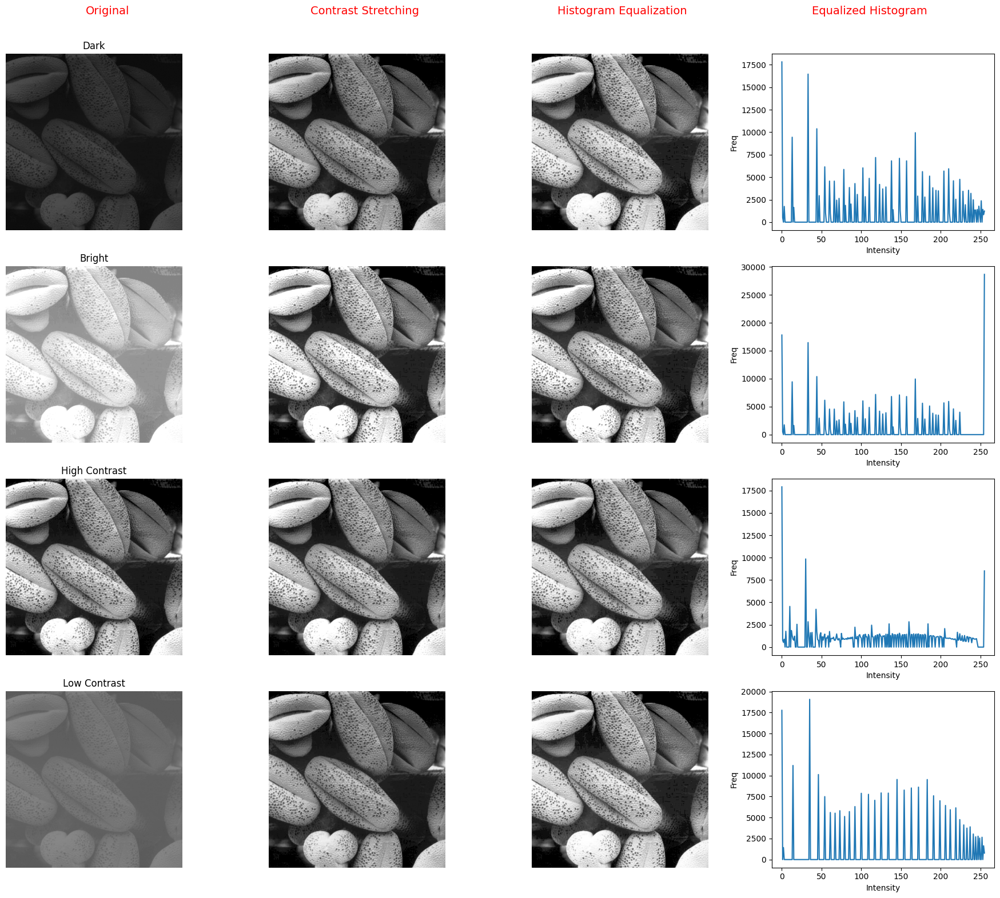

In [10]:
images=[img1,img2,img3,img4]

titles=[
    "Dark",
    "Bright",
    "High Contrast",
    "Low Contrast"
]

plt.figure(figsize=(18,16))

# Column headings
plt.figtext(
    0.13,
    0.97,
    "Original",
    ha='center',
    fontsize=14,
    color='red'
)

plt.figtext(
    0.38,
    0.97,
    "Contrast Stretching",
    ha='center',
    fontsize=14,
    color='red'
)

plt.figtext(
    0.63,
    0.97,
    "Histogram Equalization",
    ha='center',
    fontsize=14,
    color='red'
)

plt.figtext(
    0.87,
    0.97,
    "Equalized Histogram",
    ha='center',
    fontsize=14,
    color='red'
)


for i in range(4):

    img=images[i]


    # Contrast Stretching
    minv=np.min(img)

    maxv=np.max(img)

    stretch=((img-minv)/(maxv-minv))*255

    stretch=np.uint8(stretch)


    # Histogram Equalization
    eq=cv2.equalizeHist(img)


    # Histogram
    hist_eq=cv2.calcHist(
        [eq],
        [0],
        None,
        [256],
        [0,256]
    )


    # Original
    plt.subplot(4,4,4*i+1)

    plt.imshow(
        img,
        cmap='gray',
        vmin=0,
        vmax=255
    )

    plt.title(titles[i])

    plt.axis("off")


    # Contrast Stretching
    plt.subplot(4,4,4*i+2)

    plt.imshow(
        stretch,
        cmap='gray',
        vmin=0,
        vmax=255
    )

    plt.axis("off")


    # Histogram Equalization
    plt.subplot(4,4,4*i+3)

    plt.imshow(
        eq,
        cmap='gray',
        vmin=0,
        vmax=255
    )

    plt.axis("off")


    # Histogram
    plt.subplot(4,4,4*i+4)

    plt.plot(hist_eq)

    plt.xlabel("Intensity")

    plt.ylabel("Freq")


plt.tight_layout(rect=[0,0,1,.95])

plt.show()

**Compare the differences — one adjusts the linear scale, the other redistributes intensities.**

Contrast stretching and histogram equalization enhanced image contrast using different intensity transformation methods. Contrast stretching linearly expanded the pixel intensity range between minimum and maximum values which improved visibility while preserving relative brightness relationships. Histogram equalization redistributed intensity values across a wider range to improve global contrast and reveal hidden details. In the dark and low contrast images both methods significantly improved visibility, but histogram equalization produced stronger enhancement and clearer texture details. In the bright image equalization reduced excessive brightness and improved tonal balance. The high contrast image showed only moderate improvement because the original image already contained a wide intensity distribution. Histogram equalization generated a more uniformly distributed histogram compared with the original distributions, demonstrating how pixel intensities were redistributed across the full dynamic range.

Observations from output
- Dark image
  - contrast stretching brightened the image smoothly
  - histogram equalization revealed more texture details
- Bright image
  - equalization reduced washed-out appearance
  - object boundaries became clearer
- High contrast image
  - only small changes occurred because contrast was already high
- Low contrast image
  - showed the largest improvement after equalization
  - hidden structures became more visible

Compare the two methods
- Contrast Stretching
  - linear operation
  - preserves natural appearance
  - smoother enhancement
- Histogram Equalization
  - nonlinear redistribution
  - stronger contrast enhancement
  - may produce harsher appearance

**When can histogram equalization amplify noise instead of details ?**

Histogram equalization can amplify noise when the image contains grain, sensor noise or random intensity fluctuations. Since equalization spreads intensity values across the full range, small noisy variations may become exaggerated and appear as false details. This effect is especially noticeable in dark regions and textured backgrounds where noise levels are already significant.

### Task 6 — Bit-Plane Slicing

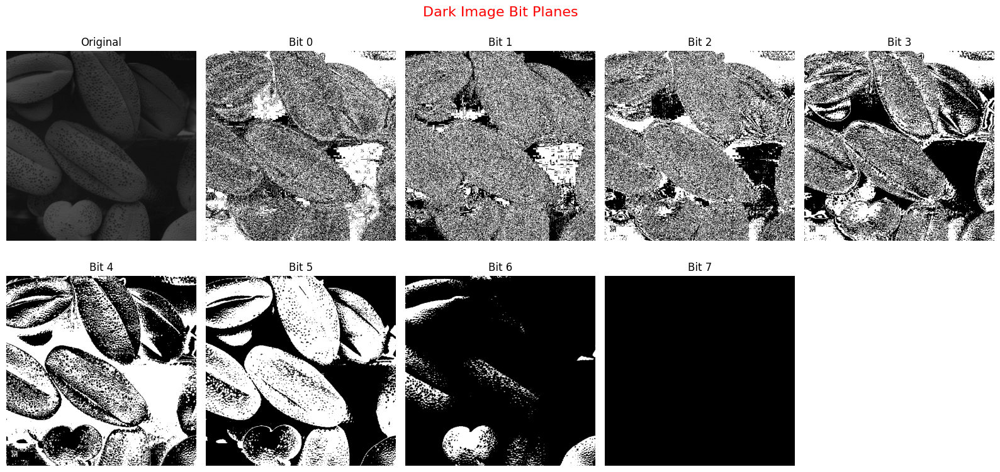

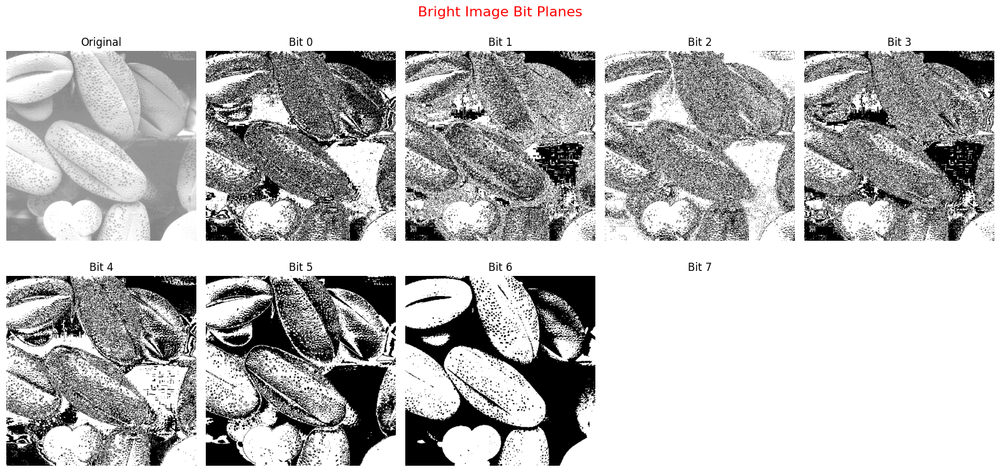

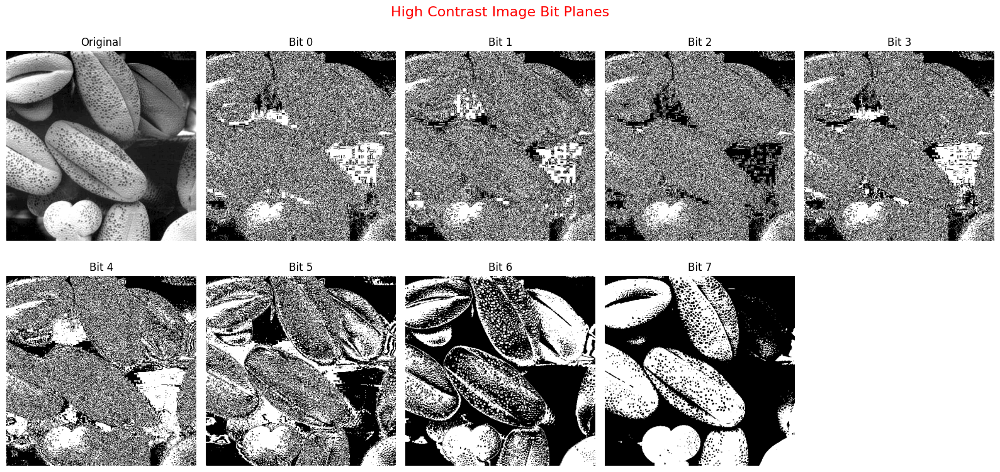

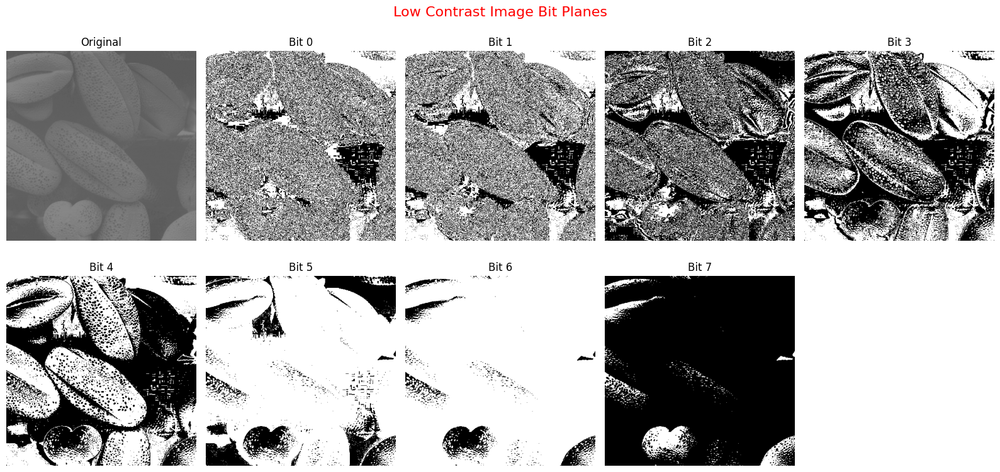

In [11]:
images=[img1,img2,img3,img4]

titles=[
    "Dark",
    "Bright",
    "High Contrast",
    "Low Contrast"
]

for k in range(4):

    img=images[k]

    plt.figure(figsize=(16,8))

    plt.suptitle(
        titles[k]+" Image Bit Planes",
        fontsize=16,
        color='red'
    )

    # Original image
    plt.subplot(2,5,1)

    plt.imshow(
        img,
        cmap='gray',
        vmin=0,
        vmax=255
    )

    plt.title("Original")

    plt.axis("off")


    # Bit planes
    for i in range(8):

        bit=(img>>i)&1

        plt.subplot(2,5,i+2)

        plt.imshow(
            bit,
            cmap='gray',
            vmin=0,
            vmax=1
        )

        plt.title(f"Bit {i}")

        plt.axis("off")


    plt.tight_layout()

    plt.show()

**Discuss why higher bit-planes carry semantic structure while lower bits capture texture/noise.**

Bit-plane slicing separated the image into eight binary layers representing different significance levels of pixel intensities. The lower bit planes such as Bit 0, Bit 1 and Bit 2 appeared noisy and contained fine texture variations with little recognizable structure. These lower planes mainly represented small intensity fluctuations and noise components. As the bit level increased, clearer structural information became visible. Higher bit planes such as Bit 6 and Bit 7 preserved the major object shapes and semantic content of the image because they contribute most strongly to overall brightness values. In the displayed results the bean structures became increasingly recognizable in higher bit planes while lower planes mainly contained scattered texture patterns. This demonstrates that higher-order bits carry the essential visual structure of the image whereas lower-order bits mostly contain subtle details and noise.

Observations from output
- Bit 0 to Bit 2
  - highly noisy appearance
  - random fine texture
  - little recognizable structure
- Bit 3 to Bit 5
  - partial bean structures begin to appear
  - edges and texture become clearer
- Bit 6 and Bit 7
  - major object shapes clearly visible
  - strongest structural information retained


Higher bit planes contribute larger intensity values to the final image. Therefore they dominate overall brightness and preserve object structure. Lower bits contribute only small intensity changes, so they mainly influence fine texture and noise.

**Could accessing lower bit-planes ever reveal hidden watermarks or metadata?**

Yes. Lower bit planes are commonly used in steganography and digital watermarking because modifying these bits causes minimal visible changes to the image. Hidden messages, authentication data or metadata can therefore be embedded into lower-order bits without significantly affecting visual appearance.


### Final Reflection


**Explain how illumination and histogram shape influence segmentation and perception. Which transformation felt most powerful, and which seemed risky without careful use?**

Illumination and histogram distribution strongly influence both image perception and segmentation performance. Dark images contain histograms concentrated at lower intensity values while bright images shift toward higher intensities. Low contrast images have narrow intensity distributions which reduce visibility of details whereas high contrast images contain a wider intensity spread that improves object separation. Thresholding performance depends heavily on these intensity distributions because fixed thresholds cannot adapt to changing lighting conditions. Among the transformations used in this lab adaptive thresholding and histogram equalization felt the most powerful because they significantly improved visibility and segmentation under difficult illumination conditions. However histogram equalization also appeared risky because it could amplify noise and create overly harsh contrast in textured regions. Overall this lab demonstrated how image enhancement techniques directly affect visual interpretation and the success of segmentation methods.